In [1]:
import pandas as pd
import numpy as mp
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
random_state = 61023
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.model_selection import GridSearchCV
import xgboost
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error

**Описание проекта:  
Промышленность**  
Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Вам предстоит построить модель, которая предскажет температуру стали.  
Описание этапа обработки
Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша.   
Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).  
Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.
Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. slab, «плита»).

**Описание данных**  
Данные состоят из файлов, полученных из разных источников:  
```data_arc_new.csv``` — данные об электродах;  
```data_bulk_new.csv``` — данные о подаче сыпучих материалов (объём);  
```data_bulk_time_new.csv``` — данные о подаче сыпучих материалов (время);  
```data_gas_new.csv``` — данные о продувке сплава газом;  
```data_temp_new.csv``` — результаты измерения температуры;  
```data_wire_new.csv``` — данные о проволочных материалах (объём);  
```data_wire_time_new.csv``` — данные о проволочных материалах (время).  
Во всех файлах столбец key содержит номер партии. В файлах может быть несколько строк с одинаковым значением key: они соответствуют разным итерациям обработки.

In [2]:
# Загрузим датасеты
pth1 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project/data_arc_new.csv'
#data about the electrodes
pth2 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project/data_bulk_new.csv'
#data on the supply of bulk materials (volume)
pth3 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project//data_bulk_time_new.csv'
#data on the supply of bulk materials (time)
pth4 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project/data_gas_new.csv'
#data on the purging of the alloy with gas
pth5 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project/data_temp_new.csv'
#temperature measurement results
pth6 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project/data_wire_new.csv'
#data on wire materials (volume)
pth7 = 'C:/Users/vrakh/OneDrive/Рабочий стол/Резюме/final_project/data_wire_time_new.csv'
#data on wire materials (time)
pth8 = '/datasets/data_arc_new.csv'
pth9 = '/datasets/data_bulk_new.csv'
pth10 = '/datasets/data_bulk_time_new.csv'
pth11 = '/datasets/data_gas_new.csv'
pth12 = '/datasets/data_temp_new.csv'
pth13 = '/datasets/data_wire_new.csv'
pth14 = '/datasets/data_wire_time_new.csv'

In [3]:
if os.path.exists(pth1):
    electrodes = pd.read_csv(pth1)
    bulk_volume = pd.read_csv(pth2)
    bulk_time = pd.read_csv(pth3)
    purging_alloy = pd.read_csv(pth4)
    temperature_measurement_results = pd.read_csv(pth5)
    wire_materials_volume = pd.read_csv(pth6)
    wire_materials_time = pd.read_csv(pth7)
elif os.path.exists(pth8):
    electrodes = pd.read_csv(pth8)
    bulk_volume = pd.read_csv(pth9)
    bulk_time = pd.read_csv(pth10)
    purging_alloy = pd.read_csv(pth11)
    temperature_measurement_results = pd.read_csv(pth12)
    wire_materials_volume = pd.read_csv(pth13)
    wire_materials_time = pd.read_csv(pth14)
else:
    print('Something is wrong')
    

In [4]:
data = {'Данные об электродах' : electrodes, 
        'Данные о подаче сыпучих материалов (объём)': bulk_volume,
        'Данные о подаче сыпучих материалов (время)' : bulk_time,
        'Данные о продувке сплава газом' : purging_alloy,
        'Результаты измерения температуры' :  temperature_measurement_results,
        'Данные о проволочных материалах (объём)' :  wire_materials_volume,
        'Данные о проволочных материалах (время)' :  wire_materials_time
       } 

In [5]:
#Выведем по 5 строк из каждого сета
for i in data.items():
    display(i[0])
    display(i[1].head(5))
    display('---------------------------------------------------------')

'Данные об электродах'

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691


'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (объём)'

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (время)'

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:28:48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:24:31,NaN,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,NaN,NaN,NaN,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:53:30,NaN,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,NaN,NaN,NaN,2019-05-03 12:32:39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:27:13,NaN,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,NaN,NaN,NaN,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:58:00,NaN,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:30:47,NaN,2019-05-03 13:34:12,2019-05-03 13:30:47


'---------------------------------------------------------'

'Данные о продувке сплава газом'

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


'---------------------------------------------------------'

'Результаты измерения температуры'

,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0


'---------------------------------------------------------'

'Данные о проволочных материалах (объём)'

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'---------------------------------------------------------'

'Данные о проволочных материалах (время)'

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:11:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'---------------------------------------------------------'

In [6]:
#Размерность данных
for i in data.items():
    print(i[0], i[1].shape)

Данные об электродах (14876, 5)
Данные о подаче сыпучих материалов (объём) (3129, 16)
Данные о подаче сыпучих материалов (время) (3129, 16)
Данные о продувке сплава газом (3239, 2)
Результаты измерения температуры (18092, 3)
Данные о проволочных материалах (объём) (3081, 10)
Данные о проволочных материалах (время) (3081, 10)


In [7]:
#Информация о данных
for i in data.items():
    print(i[0])
    print(i[1].info())
    print('---------------------------------------------------------')

Данные об электродах
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB
None
---------------------------------------------------------
Данные о подаче сыпучих материалов (объём)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk

In [8]:
#Поиск пропусков
for i in data.items():
    display(i[0])
    display(i[1].isna().sum())
    display('---------------------------------------------------------')

'Данные об электродах'

key                     0
Начало нагрева дугой    0
Конец нагрева дугой     0
Активная мощность       0
Реактивная мощность     0
dtype: int64

'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (объём)'

key           0
Bulk 1     2877
Bulk 2     3107
Bulk 3     1831
Bulk 4     2115
Bulk 5     3052
Bulk 6     2553
Bulk 7     3104
Bulk 8     3128
Bulk 9     3110
Bulk 10    2953
Bulk 11    2952
Bulk 12     679
Bulk 13    3111
Bulk 14     323
Bulk 15     881
dtype: int64

'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (время)'

key           0
Bulk 1     2877
Bulk 2     3107
Bulk 3     1831
Bulk 4     2115
Bulk 5     3052
Bulk 6     2553
Bulk 7     3104
Bulk 8     3128
Bulk 9     3110
Bulk 10    2953
Bulk 11    2952
Bulk 12     679
Bulk 13    3111
Bulk 14     323
Bulk 15     881
dtype: int64

'---------------------------------------------------------'

'Данные о продувке сплава газом'

key      0
Газ 1    0
dtype: int64

'---------------------------------------------------------'

'Результаты измерения температуры'

key                0
Время замера       0
Температура     3427
dtype: int64

'---------------------------------------------------------'

'Данные о проволочных материалах (объём)'

key          0
Wire 1      26
Wire 2    2002
Wire 3    3018
Wire 4    3067
Wire 5    3080
Wire 6    3008
Wire 7    3070
Wire 8    3062
Wire 9    3052
dtype: int64

'---------------------------------------------------------'

'Данные о проволочных материалах (время)'

key          0
Wire 1      26
Wire 2    2002
Wire 3    3018
Wire 4    3067
Wire 5    3080
Wire 6    3008
Wire 7    3070
Wire 8    3062
Wire 9    3052
dtype: int64

'---------------------------------------------------------'

In [9]:
#Поиск явных дубликатов
for i in data.items():
    display(i[0])
    display(i[1].duplicated().sum())
    display('---------------------------------------------------------')

'Данные об электродах'

0

'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (объём)'

0

'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (время)'

0

'---------------------------------------------------------'

'Данные о продувке сплава газом'

0

'---------------------------------------------------------'

'Результаты измерения температуры'

0

'---------------------------------------------------------'

'Данные о проволочных материалах (объём)'

0

'---------------------------------------------------------'

'Данные о проволочных материалах (время)'

0

'---------------------------------------------------------'

Явные дибликаты не вявлены

In [10]:
#Поиск неявных дубликатов
for i in data.items():
    display(i[0])
    display(i[1].duplicated(subset='key').sum())
    display('---------------------------------------------------------')

'Данные об электродах'

11662

'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (объём)'

0

'---------------------------------------------------------'

'Данные о подаче сыпучих материалов (время)'

0

'---------------------------------------------------------'

'Данные о продувке сплава газом'

0

'---------------------------------------------------------'

'Результаты измерения температуры'

14876

'---------------------------------------------------------'

'Данные о проволочных материалах (объём)'

0

'---------------------------------------------------------'

'Данные о проволочных материалах (время)'

0

'---------------------------------------------------------'

В следющих сетах выявлены явные дубликаты по столбцам 'key'
- 'Данные об электродах'
- 'Результаты измерения температуры'  
По условию *Во всех файлах столбец ```key``` содержит номер партии. В файлах может быть несколько строк с одинаковым значением key: они соответствуют разным итерациям обработки*

### Данные об электродах

In [11]:
electrodes.describe()

,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.662752,0.438986
std,934.571502,0.258885,5.873485
min,1.000000,0.223120,-715.479924
25%,806.000000,0.467115,0.337175
50%,1617.000000,0.599587,0.441639
75%,2429.000000,0.830070,0.608201
max,3241.000000,1.463773,1.270284


In [12]:
fig = px.histogram(data_frame=electrodes[electrodes['Реактивная мощность'] > 0], 
                   x = ['Активная мощность', 'Реактивная мощность'])
fig.update_layout(title='Активная и реактивная мощности')

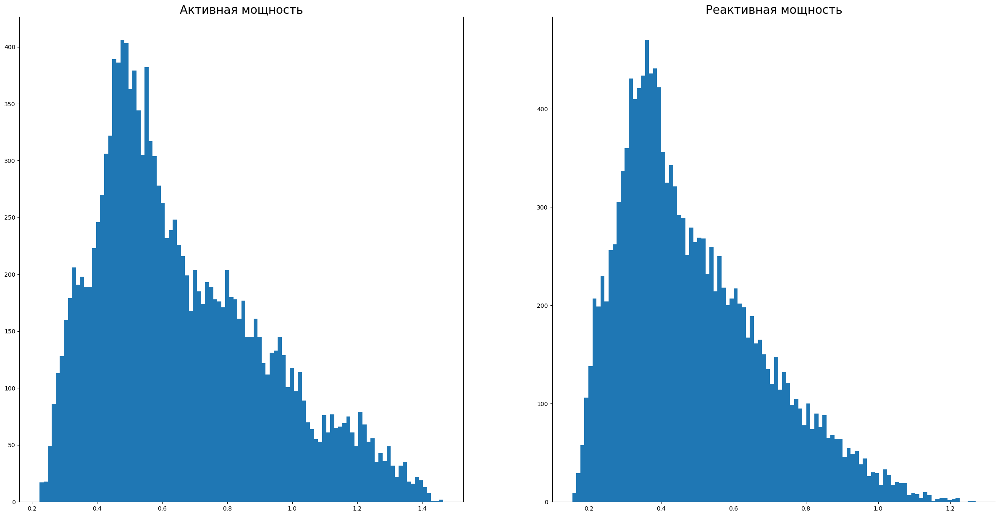

In [13]:
fig = plt.figure(figsize=(30,15))
for i in range(2):
    ax = fig.add_subplot(1, 2, i+1)
    plt.title(electrodes[['Активная мощность', 'Реактивная мощность']].columns[i], fontsize=20)
    plt.hist(electrodes[['Активная мощность', 'Реактивная мощность']][electrodes['Реактивная мощность'] > 0].iloc[:,i], bins=100)
plt.show()

- Признак 'Активная мощность' имеет распределение похожее на нормалоное со смещением влево 
- Признак 'Реактивная мощность' также имеет распределение похожее на нормалоное со смещением влево. Также в этом признаке присутствует экстримально низкое значение - '-715.479924'. Данное значение было удалено перед построением гистограммы

### Данные о подаче сыпучих материалов (объём)

In [14]:
bulk_volume.describe().T.sort_values(by='count', ascending=False)

,count,mean,std,min,25%,50%,75%,max
key,3129.0,1624.383509,933.337642,1.0,816.00,1622.0,2431.00,3241.0
Bulk 14,2806.0,170.284747,65.868652,16.0,119.00,151.0,205.75,636.0
Bulk 12,2450.0,260.471020,120.649269,53.0,204.00,208.0,316.00,1849.0
Bulk 15,2248.0,160.513345,51.765319,1.0,105.00,160.0,205.00,405.0
Bulk 3,1298.0,113.879045,75.483494,6.0,58.00,97.5,152.00,454.0
Bulk 4,1014.0,104.394477,48.184126,12.0,72.00,102.0,133.00,281.0
Bulk 6,576.0,118.925347,72.057776,17.0,69.75,100.0,157.00,503.0
Bulk 1,252.0,39.242063,18.277654,10.0,27.00,31.0,46.00,185.0
Bulk 11,177.0,76.819209,59.655365,8.0,25.00,64.0,106.00,313.0
Bulk 10,176.0,83.284091,26.060347,24.0,64.00,86.5,102.00,159.0


In [15]:
fig = px.histogram(data_frame=bulk_volume.drop('key',axis = 1))
fig.update_layout(title='Данные о подаче сыпучих материалов (объём)')

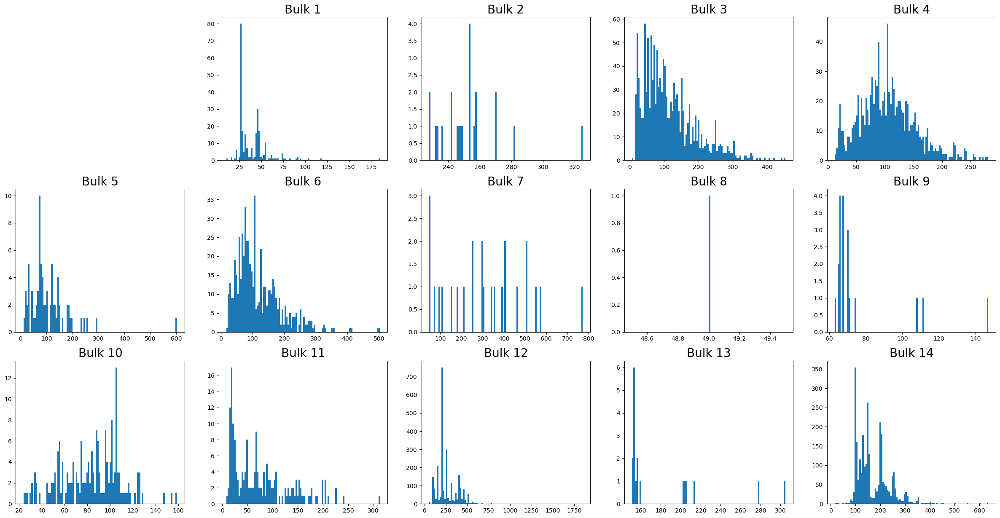

In [16]:
fig = plt.figure(figsize=(30,15))
for i in range(1,15):
    ax = fig.add_subplot(3, 5, i+1)
    plt.title(bulk_volume.columns[i], fontsize=20)
    plt.hist(bulk_volume.iloc[:,i], bins=100)
plt.show()

Согласно графику, все признаки имеют распределние **НЕ** похожее на нормальное 
Из всех признаков только ```Bulk 14, Bulk 12, Bulk 15``` имею больше половины заполненных данных
    

In [17]:
fig = px.box(data_frame=bulk_volume.drop('key',axis = 1))
fig.update_layout(title='Данные о подаче сыпучих материалов (объём) boxplot')

Для определения выбросов простроен график ```boxplot```

### Данные о подаче сыпучих материалов (время)

In [18]:
min = []
max = []
delta = []
for i in bulk_time.drop('key',axis = 1).columns:
    min.append(pd.to_datetime(bulk_time[i]).max())
    max.append(pd.to_datetime(bulk_time[i]).min())
    delta.append(pd.to_datetime(bulk_time[i]).max() - pd.to_datetime(bulk_time[i]).min())

In [19]:
min_max_delta_bulk_time = pd.DataFrame({'min' : min,
                                        'max' : max,
                                        'delta' : delta})

In [20]:
min_max_delta_bulk_time.sort_values(by='delta',ascending=False)

,min,max,delta
14,2019-09-06 17:23:15,2019-05-03 11:10:43,126 days 06:12:32
13,2019-09-06 17:26:33,2019-05-03 11:14:50,126 days 06:11:43
11,2019-09-06 15:01:44,2019-05-03 11:24:31,126 days 03:37:13
5,2019-09-06 16:24:28,2019-05-03 19:09:15,125 days 21:15:13
2,2019-09-06 12:26:52,2019-05-03 20:40:25,125 days 15:46:27
3,2019-09-05 03:35:21,2019-05-03 11:28:48,124 days 16:06:33
0,2019-09-05 09:11:32,2019-05-03 17:42:46,124 days 15:28:46
10,2019-09-06 05:03:14,2019-05-05 23:43:24,123 days 05:19:50
9,2019-09-04 10:03:22,2019-05-06 07:54:02,121 days 02:09:20
6,2019-09-05 19:07:49,2019-05-07 18:11:01,121 days 00:56:48


Построена таблица в которой определен период времени между наблюдения в зависимости от признаков

### Данные о продувке сплава газом

In [21]:
purging_alloy.describe()

,key,Газ 1
count,3239.000000,3239.000000
mean,1621.861377,11.002062
std,935.386334,6.220327
min,1.000000,0.008399
25%,812.500000,7.043089
50%,1622.000000,9.836267
75%,2431.500000,13.769915
max,3241.000000,77.995040


In [22]:
fig = px.histogram(purging_alloy['Газ 1'])
fig.update_layout(title='Данные о продувке сплава газом')

Распределение похоже на нормальное

### Результаты измерения температуры

In [23]:
temperature_measurement_results.describe()

,key,Температура
count,18092.000000,14665.000000
mean,1616.460977,1590.722741
std,934.641385,20.394381
min,1.000000,1191.000000
25%,807.750000,1580.000000
50%,1618.000000,1590.000000
75%,2429.000000,1599.000000
max,3241.000000,1705.000000


In [24]:
fig = px.histogram(temperature_measurement_results['Температура'])
fig.update_layout(title='Результаты измерения температуры')

Распределение похоже на нормальное

### Данные о проволочных материалах (объём)

In [25]:
wire_materials_volume.describe().sort_values(by='key', ascending=False).T

,max,count,75%,mean,50%,std,25%,min
key,3241.000000,3081.0,2434.000000,1623.426485,1619.000000,932.996726,823.000000,1.000000
Wire 1,330.314424,3055.0,126.060483,100.895853,100.158234,42.012518,72.115684,1.918800
Wire 2,282.780152,1079.0,70.227558,50.577323,40.142956,39.320216,20.193680,0.030160
Wire 3,385.008668,63.0,276.252014,189.482681,235.194977,99.513444,95.135044,0.144144
Wire 4,113.231044,14.0,76.124619,57.442841,45.234282,28.824667,40.807002,24.148801
Wire 5,15.132000,1.0,15.132000,15.132000,15.132000,NaN,15.132000,15.132000
Wire 6,180.454575,73.0,64.212723,48.016974,42.076324,33.919845,25.053600,0.034320
Wire 7,32.847674,11.0,11.886057,10.039007,9.017009,8.610584,6.762756,0.234208
Wire 8,102.762401,19.0,48.089603,53.625193,46.279999,16.881728,46.094879,45.076721
Wire 9,90.053604,29.0,43.862003,34.155752,30.066399,19.931616,22.058401,4.622800


In [26]:
fig = px.histogram(data_frame=wire_materials_volume.drop('key',axis = 1))
fig.update_layout(title='Данные о проволочных материалах (объём)')

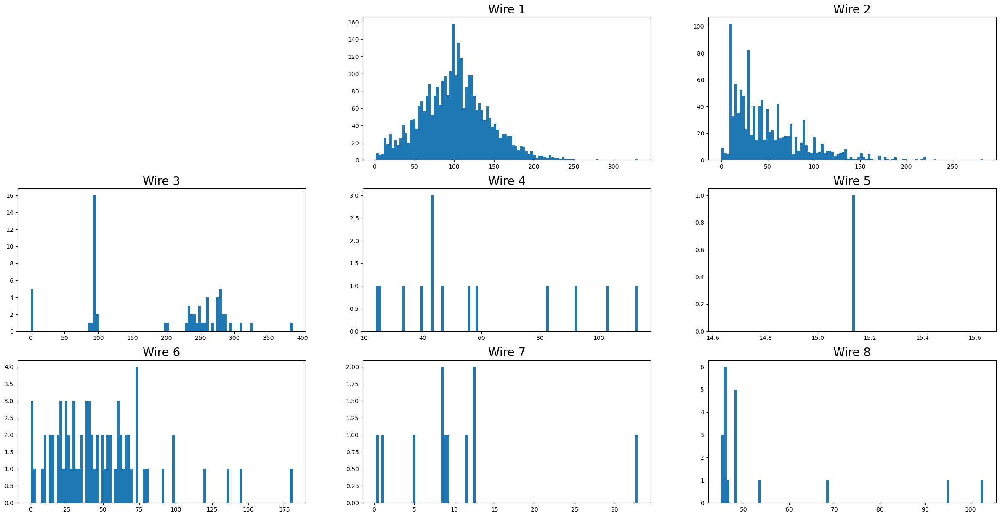

In [27]:
fig = plt.figure(figsize=(30,15))
for i in range(1,9):
    ax = fig.add_subplot(3, 3, i+1)
    plt.title(wire_materials_volume.columns[i], fontsize=20)
    plt.hist(wire_materials_volume.iloc[:,i], bins=100)
plt.show()

In [28]:
fig = px.box(data_frame=wire_materials_volume.drop('key',axis = 1))
fig.update_layout(title='Данные о проволочных материалах (объём)¶ boxplot')

- Признак Wire 1 относительно других признаков имеет распределние похожее на нормальное.
- Построен Boxplot для определения выбросов 
- Все признаки имеют очень много пропусков

### Данные о проволочных материалах (время)

In [29]:
wire_materials_time

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,2019-05-03 11:36:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,2019-05-03 12:11:46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,2019-05-03 12:43:22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3076,3237,2019-09-06 11:33:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,3238,2019-09-06 12:18:35,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3078,3239,2019-09-06 14:36:11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3079,3240,2019-09-06 15:33:55,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
min = []
max = []
delta = []
for i in wire_materials_time.drop('key',axis = 1).columns:
    min.append(pd.to_datetime(wire_materials_time[i]).max())
    max.append(pd.to_datetime(wire_materials_time[i]).min())
    delta.append(pd.to_datetime(wire_materials_time[i]).max() - pd.to_datetime(wire_materials_time[i]).min())

In [31]:
min_max_delta_wire_materials_time = pd.DataFrame({'min' : min,
                                        'max' : max,
                                        'delta' : delta})

In [32]:
min_max_delta_wire_materials_time.sort_values(by='delta',ascending=False)

,min,max,delta
0,2019-09-06 17:10:06,2019-05-03 11:06:19,126 days 06:03:47
1,2019-09-06 07:35:40,2019-05-03 13:15:34,125 days 18:20:06
8,2019-09-03 12:55:23,2019-05-04 17:21:27,121 days 19:33:56
2,2019-09-02 07:14:44,2019-05-04 04:34:27,121 days 02:40:17
5,2019-08-18 19:10:56,2019-05-07 14:46:05,103 days 04:24:51
3,2019-08-13 03:16:45,2019-05-07 15:19:17,97 days 11:57:28
7,2019-08-16 08:56:23,2019-05-14 11:29:24,93 days 21:26:59
6,2019-08-13 10:25:22,2019-07-27 05:49:05,17 days 04:36:17
4,2019-08-13 06:14:30,2019-08-13 06:14:30,0 days 00:00:00


Построена таблица в которой определен период времени между наблюдения в зависимости от признаков

### Выводы
- В таблице ```data_arc_new.csv — данные об электродах``` в признаке ```Реактивная мощность``` присутствует аномально низкое значение, которое необходимо удалить
- Во всех сетах неоходимо преобразование данных
    - формат даты имеет строчный тип (необходимо преобразование в формат datetime)
    - есть признаки, которые имеют целое значение, но определены типом float
    - необходимо привести описание столбцов к единому языку, так как поливина написана на английской языке, другая на русском, плюс следует привести к единому регистру и заменить пробел на нижнее подчеркивание
- Проведен анализ на нормальность распределения, построены графики для определения выбросов (включая boxplot)
- Большое количество пропусков возможно связано с ошибкой в датчиках, что не позволяет корректно собирать необходимую информацию
- В следющих сетах выявлены явленые дубликаты по столбцам 'key' (По условию *Во всех файлах столбец ```key``` содержит номер партии. В файлах может быть несколько строк с одинаковым значением key: они соответствуют разным итерациям обработки*):
    - 'Данные об электродах'
    - 'Результаты измерения температуры'  


**Условие**  
Проведите исследовательский анализ данных. В конце ```Jupyter Notebook``` напишите:  
Список уточняющих вопросов.  
Примерный план решения задачи. Пропишите 3–5 основных шагов, каждый поясните не более двумя предложениями.  
Цель проекта.  
Ваш исследовательский анализ, вопросы и план проверит тимлид. Свою обратную связь он даст во время вебинара.  
Выполните проект у себя на компьютере и загрузите готовую работу на сайт. Если у вас что-то не работает, воспользуйтесь нашим интерфейсом.

**Цель проекта** - решение задачи, поставленной заказчиком  

**Примерный план решения задачи**
1. Провести предобработку данных, которая включает в себя:
    - приведение данных в нужному формату
    - привести к единому формату описание столбцов
    - определить пропуски
    - определить явные и неявные дубликаты
2. Провести анализ данных
    - определить выбросы (эстримальные значения)
    - эстримальные значения (по взможности)
    - принять решение о способе устранения пропусков
3. Подготовка данных для построения модели
    - опредлеение цели задания (классификация или регрессия)
    - определение признаков включая целевой


# Подготовка данных

## Данные об электродах
data_arc_new.csv

In [33]:
electrodes.head(5)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691


In [34]:
#Приведем названия признаков к единому виду
electrodes.columns = ['key', 'start_heating', 'end_heating', 'active_power', 'reactive_power']

In [35]:
electrodes['start_heating'] = pd.to_datetime(electrodes['start_heating'])
electrodes['end_heating'] = pd.to_datetime(electrodes['end_heating'])
electrodes.info()
electrodes.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   key             14876 non-null  int64         
 1   start_heating   14876 non-null  datetime64[ns]
 2   end_heating     14876 non-null  datetime64[ns]
 3   active_power    14876 non-null  float64       
 4   reactive_power  14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


,key,start_heating,end_heating,active_power,reactive_power
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691


In [36]:
#необходимо устранить аномальное значение в признаке reactive_power
electrodes.query('reactive_power == -715.479924').index

Index([9780], dtype='int64')

In [37]:
electrodes.drop(9780,inplace=True)
electrodes.reset_index(inplace=True, drop=True)

In [38]:
#Посчитаем продолжительность нагрева в секундах
electrodes['duration'] = (electrodes['end_heating'] - electrodes['start_heating']).dt.total_seconds()

In [39]:
#выведем показатель энергии
electrodes['energy'] = electrodes['duration']*electrodes['active_power']

In [40]:
electrodes

,key,start_heating,end_heating,active_power,reactive_power,duration,energy
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305130,0.211253,228.0,69.569640
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.765658,0.477438,185.0,141.646730
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580313,0.430460,172.0,99.813836
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518496,0.379979,365.0,189.251040
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867133,0.643691,148.0,128.335684
...,...,...,...,...,...,...,...
14870,3241,2019-09-06 16:49:05,2019-09-06 16:51:42,0.439735,0.299579,157.0,69.038395
14871,3241,2019-09-06 16:55:11,2019-09-06 16:58:11,0.646498,0.458240,180.0,116.369640
14872,3241,2019-09-06 17:06:48,2019-09-06 17:09:52,1.039726,0.769302,184.0,191.309584
14873,3241,2019-09-06 17:21:58,2019-09-06 17:22:55,0.530267,0.361543,57.0,30.225219


In [41]:
#Проведем группировку
electrodes_total = electrodes.groupby('key')[['active_power','reactive_power','duration','energy']].sum()

In [42]:
electrodes_total.columns = ['sum_active_power','sum_reactive_power', 'sum_duration', 'sum_energy']
electrodes_total.info()
electrodes_total.head(5)

<class 'pandas.core.frame.DataFrame'>
Index: 3214 entries, 1 to 3241
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   sum_active_power    3214 non-null   float64
 1   sum_reactive_power  3214 non-null   float64
 2   sum_duration        3214 non-null   float64
 3   sum_energy          3214 non-null   float64
dtypes: float64(4)
memory usage: 125.5 KB


,sum_active_power,sum_reactive_power,sum_duration,sum_energy
key,,,,
1,3.036730,2.142821,1098.0,628.616930
2,2.139408,1.453357,811.0,395.281800
3,4.063641,2.937457,655.0,581.774624
4,2.706489,2.056992,741.0,543.710274
5,2.252950,1.687991,869.0,412.180480


## Результаты измерения температуры
data_temp_new.csv

In [43]:
#Приведем названия признаков к единому виду
temperature_measurement_results.columns = ['key', 'measurement_time', 'temperature']

In [44]:
#Приведем дату к формату datetime
temperature_measurement_results['measurement_time'] = pd.to_datetime(temperature_measurement_results['measurement_time'])
temperature_measurement_results.info()
temperature_measurement_results.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   key               18092 non-null  int64         
 1   measurement_time  18092 non-null  datetime64[ns]
 2   temperature       14665 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 424.2 KB


,key,measurement_time,temperature
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0


In [45]:
#Определим строки с пустыми значениями
temp_gb = temperature_measurement_results.groupby('key').count()
temp_gb['non_empty'] = (temp_gb.temperature/temp_gb.measurement_time)
temp_gb

,measurement_time,temperature,non_empty
key,,,
1,6,6,1.000000
2,5,5,1.000000
3,6,6,1.000000
4,5,5,1.000000
5,5,5,1.000000
...,...,...,...
3237,6,1,0.166667
3238,4,1,0.250000
3239,9,1,0.111111


In [46]:
print("Количество данных с пустыми значениями после группировки по key",len(temp_gb.query('non_empty < 1')))

Количество данных с пустыми значениями после группировки по key 739


In [47]:
#Удалим пустые значения
temperature_measurement_results = temperature_measurement_results.drop(temperature_measurement_results[temperature_measurement_results.key.isin(temp_gb.query('non_empty < 1').index.values)].index)

In [48]:
#Сгруппируем данные на начальную и конечную температуры
tmr_final = temperature_measurement_results.groupby('key')[['measurement_time','temperature']].agg(['first', 'last'])
tmr_final.columns = ['time_start', 'time_end','temp_start', 'temp_end']
tmr_final = tmr_final.drop(['time_start', 'time_end'], axis=1)
tmr_final.info()
tmr_final.head(5)

<class 'pandas.core.frame.DataFrame'>
Index: 2477 entries, 1 to 2499
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   temp_start  2477 non-null   float64
 1   temp_end    2477 non-null   float64
dtypes: float64(2)
memory usage: 58.1 KB


,temp_start,temp_end
key,,
1,1571.0,1613.0
2,1581.0,1602.0
3,1596.0,1599.0
4,1601.0,1625.0
5,1576.0,1602.0


## Данные о подаче сыпучих материалов (объём)
data_bulk_new.csv

In [49]:
#Приведем названия столбцов к единому стилю
bulk_volume.columns = ['key','bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6', 'bulk_7',
                       'bulk_8', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13',
                       'bulk_14', 'bulk_15']
bulk_volume = bulk_volume.fillna(0)
bulk_volume.set_index('key', inplace=True)

## Данные о проволочных материалах (объём)
data_wire_new.csv

In [50]:
wire_materials_volume

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
3076,3237,38.088959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3077,3238,56.128799,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3078,3239,143.357761,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3079,3240,34.070400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
#Приведем названия столбцов к единому стилю
wire_materials_volume.columns = ['key','wire_1', 'wire_2', 'wire_3', 'wire_4', 
                                 'wire_5', 'wire_6', 'wire_7', 'wire_8', 'wire_9']
wire_materials_volume = wire_materials_volume.fillna(0)
wire_materials_volume.set_index('key', inplace=True)

## Данные о продувке сплава газом
data_gas_new.csv

In [52]:
#Приведем названия столбцов к единому стилю
purging_alloy.columns = ['key','gas']

## Объединение данных для построения модели

In [53]:
#Далее представлены сеты для построения модели
display(electrodes_total.head(5))
display(tmr_final.head(5))
display(purging_alloy.head(5))
display(wire_materials_volume.head(5))
display(bulk_volume.head(5))

,sum_active_power,sum_reactive_power,sum_duration,sum_energy
key,,,,
1,3.036730,2.142821,1098.0,628.616930
2,2.139408,1.453357,811.0,395.281800
3,4.063641,2.937457,655.0,581.774624
4,2.706489,2.056992,741.0,543.710274
5,2.252950,1.687991,869.0,412.180480


,temp_start,temp_end
key,,
1,1571.0,1613.0
2,1581.0,1602.0
3,1596.0,1599.0
4,1601.0,1625.0
5,1576.0,1602.0


,key,gas
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9
key,,,,,,,,,
1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15
key,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0


In [54]:
#Объединим обработанные датасеты
df_final = (tmr_final.merge(electrodes_total, how = 'inner', on = 'key')
                 .merge(purging_alloy, how = 'inner', on = 'key')
                 .merge(bulk_volume, how = 'inner', on = 'key')
                 .merge(wire_materials_volume, how = 'inner', on = 'key')
       )

In [55]:
df_final

,key,temp_start,temp_end,sum_active_power,sum_reactive_power,sum_duration,sum_energy,gas,bulk_1,bulk_2,...,bulk_15,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9
0,1,1571.0,1613.0,3.036730,2.142821,1098.0,628.616930,29.749986,0.0,0.0,...,154.0,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,1581.0,1602.0,2.139408,1.453357,811.0,395.281800,12.555561,0.0,0.0,...,154.0,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,1596.0,1599.0,4.063641,2.937457,655.0,581.774624,28.554793,0.0,0.0,...,153.0,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,1601.0,1625.0,2.706489,2.056992,741.0,543.710274,18.841219,0.0,0.0,...,154.0,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,1576.0,1602.0,2.252950,1.687991,869.0,412.180480,5.413692,0.0,0.0,...,152.0,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2324,2495,1570.0,1591.0,3.168133,2.210936,723.0,571.539318,7.125735,0.0,0.0,...,223.0,89.150879,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2325,2496,1554.0,1591.0,4.174918,2.872031,940.0,675.222467,9.412616,0.0,0.0,...,226.0,114.179527,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2326,2497,1571.0,1589.0,3.605239,2.452092,569.0,680.326674,6.271699,0.0,0.0,...,226.0,94.086723,9.04800,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2327,2498,1591.0,1594.0,3.202310,2.239820,750.0,474.918795,14.953657,0.0,0.0,...,207.0,118.110717,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Построим корреляционную матрицу для опредлеения зависимостей признаков и мультиколлинеарности

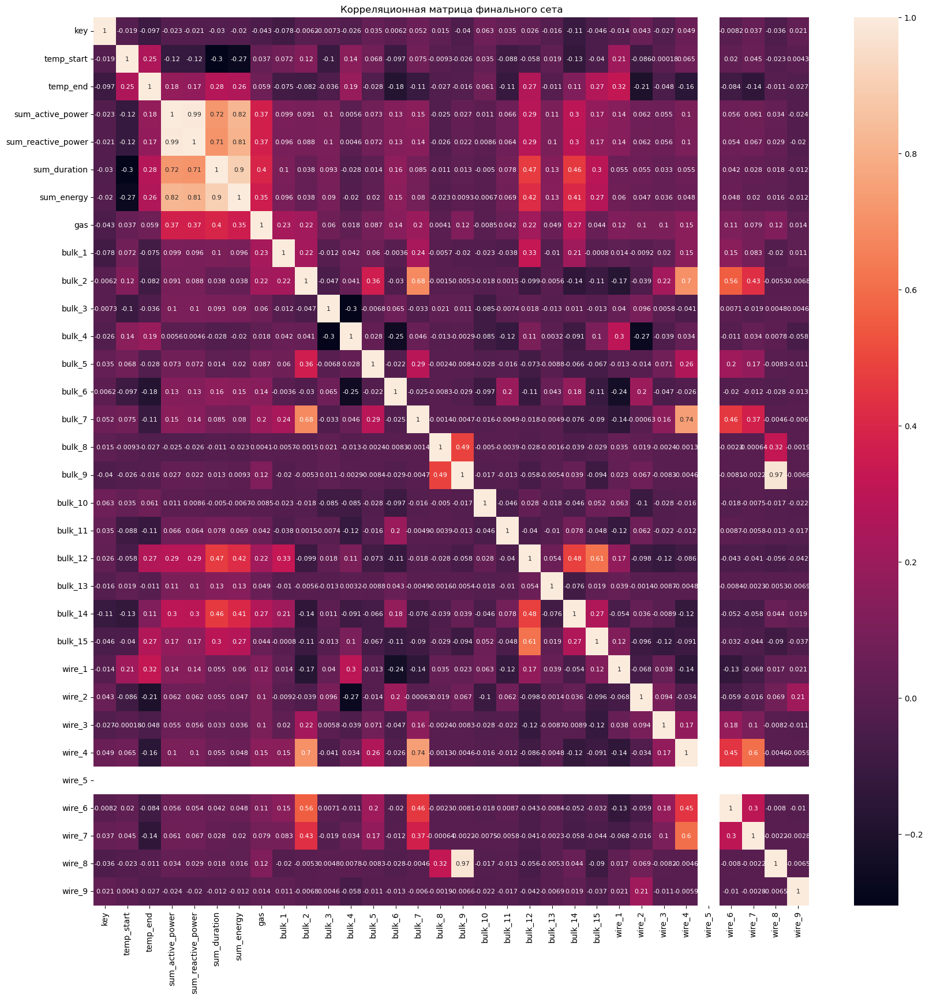

In [56]:
plt.figure(figsize=(20,20))
sns.heatmap(df_final.corr(), annot=True, annot_kws={"size": 8})
plt.title('Корреляционная матрица финального сета')
plt.show()

удалим признаки:  
- wire_5(значения пустые)  
- wire_8 (мультиколлинеарность с bulk_9)    
- key  
- sum_reactive_power (сильная зависимость между активной и реактивной мощностями)
- sum_duration  

In [57]:
df_final.drop(['sum_reactive_power', 'wire_8', 'wire_5', 'sum_duration','key'], axis = 1, inplace=True)

In [58]:
df_final.head(5)

,temp_start,temp_end,sum_active_power,sum_energy,gas,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,...,bulk_13,bulk_14,bulk_15,wire_1,wire_2,wire_3,wire_4,wire_6,wire_7,wire_9
0,1571.0,1613.0,3.036730,628.616930,29.749986,0.0,0.0,0.0,43.0,0.0,...,0.0,150.0,154.0,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0
1,1581.0,1602.0,2.139408,395.281800,12.555561,0.0,0.0,0.0,73.0,0.0,...,0.0,149.0,154.0,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0
2,1596.0,1599.0,4.063641,581.774624,28.554793,0.0,0.0,0.0,34.0,0.0,...,0.0,152.0,153.0,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0
3,1601.0,1625.0,2.706489,543.710274,18.841219,0.0,0.0,0.0,81.0,0.0,...,0.0,153.0,154.0,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0
4,1576.0,1602.0,2.252950,412.180480,5.413692,0.0,0.0,0.0,78.0,0.0,...,0.0,151.0,152.0,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0


In [59]:
df_final.columns

Index(['temp_start', 'temp_end', 'sum_active_power', 'sum_energy', 'gas',
       'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6', 'bulk_7',
       'bulk_8', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13',
       'bulk_14', 'bulk_15', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6',
       'wire_7', 'wire_9'],
      dtype='object')

## Вывод по подготовке данных

Проведена подготовка данных для построения модели. Описание признаков приведены к единому формату. Сеты неоходимые для модели подверглись ряду изменений:  
1. Данные об электродах
    - устранены аномальные значения
    - объединены данные по ключу key для суммирования признаков
2. Результаты измерения температуры
    - Удалены пустые и анамальные значения
    - объединены данные по ключу key для суммирования признаков и определения начальной и конечной температуры после замеров (конечная температура является целевым признаком)
3. Данные о подаче сыпучих материалов (объём), Данные о проволочных материалах (объём)
    - Проведена замена пустых значений на 0
4. Проведено объединение вышеуказанных таблиц плюс Данные о продувке сплава газом для создания финального сета для обучения
5. В финальном сете выявлены признаки, которые имеют мультиколлинеарность (удалены) после построения корреляционной матрицы

# Обучение модели

**В качестве метрики выбрана** - ```Mean Absolute Error (MAE)```

In [60]:
#Определим признаки включая целевой
features = df_final.drop('temp_end', axis=1)
target = df_final['temp_end']

In [61]:
#Разобъем данные на тестовую и обучающие выборки (оставим на тест 25%)
features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.25, random_state=random_state)

In [62]:
#Проведем стандартизацию данных
scaler = StandardScaler()
scaler.fit(features_train)
features_train_scaled = pd.DataFrame(scaler.transform(features_train), columns = features_train.columns)
features_test_scaled = pd.DataFrame(scaler.transform(features_test), columns = features_test.columns)

In [63]:
#Проверим размерность исходных данных
display(features_train_scaled.shape)
display(features_test_scaled.shape)
display(target_test.shape)
display(target_test.shape)

(1746, 26)

(583, 26)

(583,)

(583,)

## LinearRegression

In [64]:
model_LR = LinearRegression()

cv_MAE_LR = (cross_val_score(model_LR,
                            features_train_scaled,
                            target_train,
                            cv=5,
                            verbose=5,
                            scoring='neg_mean_absolute_error').mean() * -1)
print('MAE LinearRegression:', cv_MAE_LR)

[CV] END ............................... score: (test=-6.878) total time=   0.0s
[CV] END ............................... score: (test=-6.910) total time=   0.0s
[CV] END ............................... score: (test=-7.196) total time=   0.0s
[CV] END ............................... score: (test=-6.970) total time=   0.0s
[CV] END ............................... score: (test=-6.695) total time=   0.0s
MAE LinearRegression: 6.9298925259923605


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


## CatBoostRegressor

In [65]:
%%time
model_CB = CatBoostRegressor(random_state=random_state, verbose=False)
params = {
          'n_estimators': np.arange(400, 800, 100),  
          'learning_rate': np.arange(0.01, 0.06, 0.01),
          'depth': np.arange(3, 7)}

tuning_model_CB = GridSearchCV(estimator = model_CB,
                          param_grid= params,
                          scoring='neg_mean_absolute_error',
                          cv=5,
                          verbose=5
                          )

tuning_model_CB.fit(features_train_scaled, target_train)
print('Лучшие параметры:', tuning_model_CB.best_params_)
print('MAE CatBoostRegressor:', -1 * tuning_model_CB.best_score_)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV 1/5] END depth=3, learning_rate=0.01, n_estimators=400;, score=-6.897 total time=   0.6s
[CV 2/5] END depth=3, learning_rate=0.01, n_estimators=400;, score=-6.981 total time=   0.5s
[CV 3/5] END depth=3, learning_rate=0.01, n_estimators=400;, score=-7.013 total time=   0.4s
[CV 4/5] END depth=3, learning_rate=0.01, n_estimators=400;, score=-6.836 total time=   0.4s
[CV 5/5] END depth=3, learning_rate=0.01, n_estimators=400;, score=-6.576 total time=   0.4s
[CV 1/5] END depth=3, learning_rate=0.01, n_estimators=500;, score=-6.811 total time=   0.5s
[CV 2/5] END depth=3, learning_rate=0.01, n_estimators=500;, score=-6.911 total time=   0.5s
[CV 3/5] END depth=3, learning_rate=0.01, n_estimators=500;, score=-6.941 total time=   0.5s
[CV 4/5] END depth=3, learning_rate=0.01, n_estimators=500;, score=-6.768 total time=   0.5s
[CV 5/5] END depth=3, learning_rate=0.01, n_estimators=500;, score=-6.512 total time=   0.6s
[CV 1/5]

## XGBRegressor

In [66]:
%%time
model_XB = xgboost.XGBRegressor(random_state=random_state)
params = {
        'min_child_weight': [10,20,30],
        'max_depth': [5,10,20]
        }

tuning_model=GridSearchCV(estimator = model_XB,
                          param_grid= params,
                          scoring='neg_mean_absolute_error',
                          cv=5,
                          verbose=5
                          )

tuning_model.fit(features_train_scaled, target_train)
print('Лучшие параметры:', tuning_model.best_params_)
print('MAE XGBRegressor:', -1 * tuning_model.best_score_)

Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5] END .max_depth=5, min_child_weight=10;, score=-7.014 total time=   0.1s
[CV 2/5] END .max_depth=5, min_child_weight=10;, score=-6.879 total time=   0.1s
[CV 3/5] END .max_depth=5, min_child_weight=10;, score=-7.097 total time=   0.1s
[CV 4/5] END .max_depth=5, min_child_weight=10;, score=-7.497 total time=   0.1s
[CV 5/5] END .max_depth=5, min_child_weight=10;, score=-6.706 total time=   0.1s
[CV 1/5] END .max_depth=5, min_child_weight=20;, score=-7.042 total time=   0.1s
[CV 2/5] END .max_depth=5, min_child_weight=20;, score=-6.953 total time=   0.2s
[CV 3/5] END .max_depth=5, min_child_weight=20;, score=-7.078 total time=   0.1s
[CV 4/5] END .max_depth=5, min_child_weight=20;, score=-7.022 total time=   0.2s
[CV 5/5] END .max_depth=5, min_child_weight=20;, score=-6.809 total time=   0.1s
[CV 1/5] END .max_depth=5, min_child_weight=30;, score=-7.133 total time=   0.1s
[CV 2/5] END .max_depth=5, min_child_weight=30;, 

После тренировочного обучения получились следующие результаты ``MAE``:
 - LinearRegression - 6.9298925259923605
 - CatBoostRegressor - 6.409100573831414
 - XGBRegressor - 6.972106896018279

Лучшее значение показала модель CatBoostRegressor, проведем тестовые замеры

In [67]:
pred_test=tuning_model_CB.predict(features_test_scaled)
print('MAE тестовая выборка', mean_absolute_error(pred_test, target_test))

MAE тестовая выборка 6.1636481954094045


In [68]:
feature_importance = pd.Series(tuning_model_CB.best_estimator_.feature_importances_,
                               index=features_train.columns)
feature_importance = feature_importance.sort_values(ascending=False)

In [69]:
fig = px.bar(feature_importance)
fig.update_layout(title='Важность признаков')

На фоне остальных признаков выделяяются стартововая температура и суммарная энергия

Лучшей моделью стала CatBoostRegressor с показателем ```MAE``` - 6.1636481954094045, что говорит нам о том, что модель в среднем ошибается на 6,2 градуса

# Итоговый вывод
Первостепенная задача, которая ставилась перед заказчиком: ```Дать рекомендации как понизить производственные расходы, металлургического комбината ООО «Так закаляем сталь» путем построения модели, которая позволит уменьшить потребление электроэнергии на этапе обработки стали``` - выполнена.  
Что было сделано:
- В первой части работы был проведен анализ предоставленных данных. Определены аномалии. Построены графики для наглядного представляния. Сделаны промежуточные выводы
- Во второй части проекта проведена подготовка данных для дальнейшего построения модели. Устанены выявленные аномолии на предыдущем этапе, проведено агрегированние данных, подобраны лучшие параменты для модели, определен целевой признак
- Построены 3 модели: LinearRegression, CatBoostRegressor, XGBRegressor. Лучшее значение на тренировочной выборке показала модель CatBoostRegressor
- На базе лучших параметров модели CatBoostRegressor проведено предcказание значений на тестовой выборке
- Получились следующие значения метрики ```MAE``` на тестовой выборке - 6.1636481954094045

Николай привет, спасибо большое за развернутный ответ!  
Если я правильно поимаю, по проекту все ок и остался только отчет?  
Касаемо уменьшения разброса в измерениях, правильно я понял, что в данных ```Результаты измерения температуры
data_temp_new.csv``` можно определить пороговую температуру и исключить значения выше этого порога?

# Отчет

**Этапы проекта**
1. Исследовательский анализ:
    - Проведен статистический анализ данных
    - Произведена визуализация предоставленных данных 
    - Выявлены аномалии, экстримальные выбросы, а также пропущенные значения в данных 
2. Подготовка данных:
    - Во всех таблицах описание признаков приведено к единому виду
    - Устранены аномалии, экстримальные выбросы, а также пропущенные значения в данных, выявленные в предыдущем этапе
    - Проведено агрегированние данных в таблицах ```data_arc_new.csv```, ```data_temp_new.csv```, выведены новые параметры, которые необходимы для обучения модели
    - В итогую таблицу путем объединения вошли следующие таблицы ```data_arc_new.csv```(после агрегирования), ```data_temp_new```(после агрегирования), ```data_bulk_new.csv```, ```data_gas_new.csv```, ```data_wire_new.csv```
    - После объединения, построена корреляционная матрица, выявлена мультиколлинеарность некоторых признаков, часть признаков удалены
    - определен целевой признак
3. Обучение модели:
    - Данные разделены на обучающую и тестовую выборки в соотношении 75/25
    - Проведена стандартизация данных
    - Выбраны 3 модели для обучения LinearRegression, CatBoostRegressor, XGBRegressor с использованием кросс-валидации 
    - Лучшей моделью стала CatBoostRegressor с показателем MAE (на тестовой выборке) - 6.1636481954094045, что говорит нам о том, что модель в среднем ошибается на 6,2 градуса  

**Признаки для обучения модели**
- ```temp_end``` - целевой признак
- ```'temp_start', 'sum_active_power', 'sum_energy', 'gas',
       'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6', 'bulk_7',
       'bulk_8', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12', 'bulk_13',
       'bulk_14', 'bulk_15', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_6',
       'wire_7', 'wire_9'``` - влияющие признаки
       
**Трудности**  
*Основные трудности возникли на этапе подготовке данных:*
1. Потребовалось время и знания, чтобы разобраться в специфике деятельности заказчика
2. Правильно выбрать признаки (включая целевой) для обучения модели
3. Определение новых признков путем математических операций с имеющимися признаками
4. Соблюдение последовательности действий для сбора итоговых данных

*Трудности в процессе обучения модели:* 
1. Подобрать правильно гипперпараметры модели (найти золотую серидину: затраченное время в процессе перебора гипперпараметров и оптимального качества метрики)

**Ключевые шаги в решении задачи**
1. Анализ данных - является важным шагов, позволяющим изучить представленные данные, найти аномалии, экстримальные выбросы, а также пропущенные значения
2. Определение и формирование признаков включая целевой
3. Обучение и выбор лучшей модели

**Итоговая модель**

Лучшей моделью после проведения кросс-валидации стала CatBoostRegressor, на тестовой выборке удалось получить следующее значение метрики при выбранных гиперпараметраx:

- ```MAE``` - 6.1636481954094045
- ```depth``` - 4
- ```learning_rate``` -  0.03
- ```n_estimators``` - 700
- ```random_state``` - 61023

**Рекомендации по улучшению модели**
1. Более углубленное изучение признаков, например определение границы, в пределах которых колеблется температура
2. Более тонкая настройка гиперпараметров для повышения заданной метрики